In [1]:
import pandas as pd
import numpy as np

In [36]:
class Person:
    def __init__(self, **kwargs):
        ## assign all args to self.
        for key, value in kwargs.items():
            setattr(self, key, value)
    def __str__(self):
        return f"""
            {self.name} is a {self.occupation} who is {self.age} years old.
            They have an annual income of {self.income}
            They are quite interested in {self.hobbies}
        """
    def assign_position(self, x, y):
        self.x = x
        self.y = y
    
class USPerson(Person):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.income = str(self.income) + " USD"

class IndiaPerson(Person):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.income = str(self.income) + " INR"

In [37]:
import glob

sampled_agent_files = glob.glob("raw_agents/*sampled*.json")
sampled_agent_mat_score_files = glob.glob("raw_agents/*scores*.json")

sampled_agent_files, sampled_agent_mat_score_files

(['raw_agents\\india_exp_agents_sampled.json',
  'raw_agents\\us_exp_agents_sampled.json'],
 ['raw_agents\\india_exp_mat_scores_4o_mini.json',
  'raw_agents\\us_exp_mat_scores_4o_mini.json'])

In [38]:
import json

with open(sampled_agent_mat_score_files[0], "r") as f:
    india_scores_raw = json.load(f)

In [39]:
with open(sampled_agent_mat_score_files[1], "r") as f:
    us_scores_raw = json.load(f)

In [40]:
# india_scores[list(india_scores.keys())[0]]

In [41]:
india_scores = {}
us_scores = {}

for key, value in india_scores_raw.items():
    try:
        compatibility_score = value["CompatibilityPercentage"]
        compatibility_explanation = value["CompatibilityExplanation"]
    except:
        try:
            parsed_json = value.replace("```json", "").replace("```", "")
            parsed_json = json.loads(parsed_json)
            # print(parsed_json)
            compatibility_score = parsed_json["CompatibilityPercentage"]
            compatibility_explanation = parsed_json["CompatibilityExplanation"]
        except Exception as e:
            # print(f"Exception: {e} at key: {key}")
            continue
    india_scores[key] = {"CompatibilityScore": compatibility_score, "CompatibilityExplanation": compatibility_explanation}

In [42]:
for key, value in us_scores_raw.items():
    try:
        compatibility_score = value["CompatibilityPercentage"]
        compatibility_explanation = value["CompatibilityExplanation"]
    except:
        try:
            parsed_json = value.replace("```json", "").replace("```", "")
            parsed_json = json.loads(parsed_json)
            # print(parsed_json)
            compatibility_score = parsed_json["CompatibilityPercentage"]
            compatibility_explanation = parsed_json["CompatibilityExplanation"]
        except Exception as e:
            # print(f"Exception: {e} at key: {key}")
            continue
    us_scores[key] = {"CompatibilityScore": compatibility_score, "CompatibilityExplanation": compatibility_explanation}

In [43]:
india_scores_df = pd.DataFrame(india_scores).T
india_scores_df.head()

,CompatibilityScore,CompatibilityExplanation
score_262_1653,65,Neha and Sunil have different professional bac...
score_262_2323,60,Neha and Madhavan have different interests and...
score_262_928,65,Neha and Mingma have different professional ba...
score_262_33,60,Neha and Anmol have different professional bac...
score_262_935,55,Neha and Phurba have different interests and l...


In [44]:
india_scores_df["CompatibilityScore"] = india_scores_df["CompatibilityScore"].astype(float)

(array([1.1000e+01, 1.7900e+02, 1.6450e+03, 0.0000e+00, 1.4556e+04,
        2.5240e+03, 0.0000e+00, 9.4510e+03, 1.6633e+04, 0.0000e+00,
        6.0900e+02, 1.3858e+04, 5.2626e+04, 0.0000e+00, 3.8160e+04,
        5.7960e+03, 0.0000e+00, 2.8000e+03, 8.2000e+01, 3.7500e+02]),
 array([15. , 18.5, 22. , 25.5, 29. , 32.5, 36. , 39.5, 43. , 46.5, 50. ,
        53.5, 57. , 60.5, 64. , 67.5, 71. , 74.5, 78. , 81.5, 85. ]),
 <BarContainer object of 20 artists>)

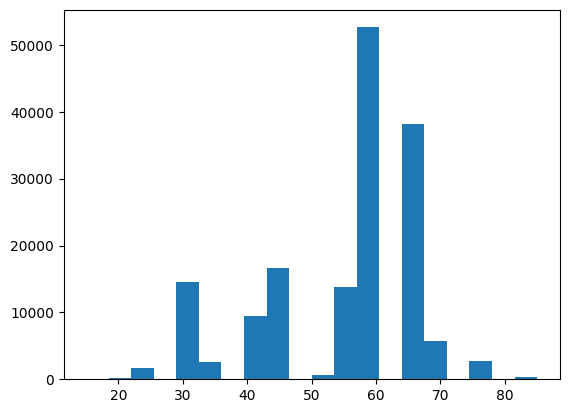

In [45]:
import matplotlib.pyplot as plt

plt.hist(india_scores_df["CompatibilityScore"], bins=20)

In [46]:
## get average, standard deviation, 75th percentile, 25th percentile
india_scores_df["CompatibilityScore"].describe()

count    159305.000000
mean         55.121748
std          12.164137
min          15.000000
25%          45.000000
50%          60.000000
75%          65.000000
max          85.000000
Name: CompatibilityScore, dtype: float64

In [47]:
us_scores_df = pd.DataFrame(us_scores).T
us_scores_df.head()

,CompatibilityScore,CompatibilityExplanation
score_229_1355,65,Poonam Sinha and Zola Lauren Jenkins have diff...
score_229_2130,60,Poonam Sinha and Mariana Francisca Peï¿½a have...
score_229_360,45,Poonam Sinha and Dong-Hyun Kim have different ...
score_229_995,65,Poonam and Zariah have different professional ...
score_229_2514,35,Poonam Sinha and Nadine Bassam have a signific...


In [48]:
us_scores_df["CompatibilityScore"] = us_scores_df["CompatibilityScore"].astype(float)

(array([1.2300e+02, 4.2200e+02, 3.2000e+03, 0.0000e+00, 1.7842e+04,
        5.6660e+03, 9.1310e+03, 0.0000e+00, 1.6534e+04, 3.7100e+02,
        1.8737e+04, 0.0000e+00, 4.4177e+04, 3.4120e+04, 5.1910e+03,
        0.0000e+00, 3.3210e+03, 6.8000e+01, 5.7700e+02, 9.0000e+00]),
 array([15.  , 18.75, 22.5 , 26.25, 30.  , 33.75, 37.5 , 41.25, 45.  ,
        48.75, 52.5 , 56.25, 60.  , 63.75, 67.5 , 71.25, 75.  , 78.75,
        82.5 , 86.25, 90.  ]),
 <BarContainer object of 20 artists>)

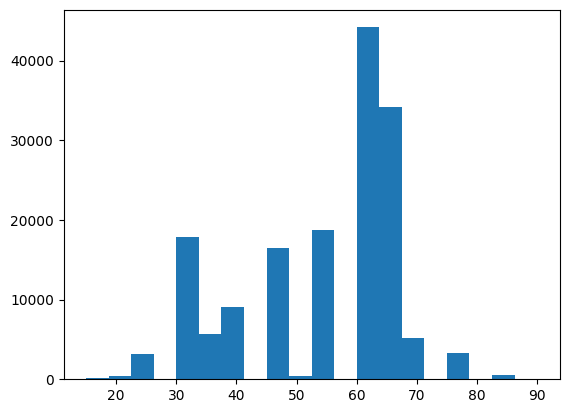

In [49]:
plt.hist(us_scores_df["CompatibilityScore"], bins=20)

In [50]:
us_scores_df["CompatibilityScore"].describe()

count    159489.000000
mean         53.410392
std          13.228939
min          15.000000
25%          45.000000
50%          60.000000
75%          65.000000
max          90.000000
Name: CompatibilityScore, dtype: float64

In [51]:
stats_in = india_scores_df["CompatibilityScore"].describe().to_dict()
stats_us = us_scores_df["CompatibilityScore"].describe().to_dict()

In [83]:
stats_in["25%"]

45.0

In [53]:
with open(sampled_agent_files[0], "r") as f:
    india_agents = json.load(f)

with open(sampled_agent_files[1], "r") as f:
    us_agents = json.load(f)

india_agents = [IndiaPerson(**agent) for agent in india_agents]
us_agents = [USPerson(**agent) for agent in us_agents]

In [54]:
len(india_agents), len(us_agents)

(400, 400)

In [79]:
api_key = None

with open(".env", "r") as f:
    for line in f:
        if line.startswith("OPENAI_API_KEY"):
            api_key = line.split("=")[1].strip()

from openai import OpenAI
client = OpenAI(api_key=api_key)

def check_compatability_prepare_messages(person1, person2):
    messages=[
        { "role" : "system", "content": "You are a specialist in real estate and public policy, You are tasked with assessing the compatibility between two potential neighours."},
        { "role": "user", "content": f"""
            Assess the compatibility between
                Person A: {str(person1)} 
                
                and
            
            Person B: {str(person2)}, Respond in this format: 
            ```json
            {{
                "CompatibilityExplanation": "string", // Explain the reasoning behind your answer.
                "CompatibilityPercentage": "number" // The percentage of compatibility between the two individuals.
            }}
            ```         
        """}
    ]

    return messages

def check_compatability(id_1, id_2, messages, model):
    completion = client.chat.completions.create(
        temperature=0,
        top_p=0.95,
        model = model,
        messages=messages
    )

    content = completion.choices[0].message.content

    return id_1, id_2, content

def compute_compatibility(person1, person2, model = "gpt-4o-mini"):
    print(f"Computing compatibility between {person1.name} and {person2.name}")
    messages = check_compatability_prepare_messages(person1, person2)
    id_1, id_2, content = check_compatability(person1.name, person2.name, messages, model)
    json_content = content.replace("```json", "").replace("```", "")
    json_content = json.loads(json_content)
    print(json_content)
    return id_1, id_2, json_content

In [89]:
def get_score(agent_1, agent_2, scores_mat):
    if f"score_{agent_1.id}_{agent_2.id}" in scores_mat:
        print(f"Score already computed for {agent_1.id} and {agent_2.id}")
        return int(scores_mat[f"score_{agent_1.id}_{agent_2.id}"]["CompatibilityScore"])
    else:
        id1, id2, json_score = compute_compatibility(agent_1, agent_2)
        json_score["CompatibilityScore"] = json_score["CompatibilityPercentage"]
        scores_mat[f"score_{id1}_{id2}"] = json_score
        return int(json_score["CompatibilityPercentage"])

In [90]:
getattr(india_agents[0], "income_group")
india_agents[0].__dict__

{'id': 262,
 'name': 'Neha Vohra  ',
 'name_group': 'north',
 'occupation': 'Nurse',
 'occupation_group': 'Services',
 'age': 47,
 'age_group': '45–49',
 'income': '361034 INR',
 'income_group': 'Middle Class',
 'hobbies': 'hosting events and group gaming',
 'hobbies_group': 'social',
 'x': np.int64(0),
 'y': np.int64(27)}

In [98]:
## Number of agents fixed at 400.
## Size of grid fixed at 28x28.
## mode between india | us
## setting between 25per-favourable | 50per-favourable | 75per-favourable | 50per-veryfavourable | 50per-somewhatfavourable.

class LLMGrid:
    def __init__(self, mode = "india", setting = "50per-favourable"):
        if mode == "india":
            self.stats = stats_in
            self.scores = india_scores
            self.agents = india_agents
        elif mode == "us":
            self.stats = stats_us
            self.scores = us_scores
            self.agents = us_agents
        else:
            raise ValueError("Mode can only be 'india' or 'us'.")
        self.setting = setting
        self.width, self.height = 28, 28
        self.grid = [[None for _ in range(self.width)] for _ in range(self.height)]
        ## randomly select 400 positions out of 28x28 grid to fill.
        positions = np.random.choice(range(28*28), 400, replace=False)
        for idx, position in enumerate(positions):
            x, y = position//28, position%28
            self.grid[x][y] = self.agents[idx]
            self.agents[idx].assign_position(x, y)

        ## prepare for plots between round vs. each `group` param.
        self.graphs = {}
        self.group_params = ["age_group", "income_group", "hobbies_group", "occupation_group", "name_group"]
        for g in self.group_params:
            self.graphs[f"{g}_similarity"] = []
        self.scoring_fn = get_score
    
    def get_neighbours(self, x, y):
        neighbours = []
        if x > 0:
            neighbours.append(self.grid[x-1][y])
        if x < self.width - 1:
            neighbours.append(self.grid[x+1][y])
        if y > 0:
            neighbours.append(self.grid[x][y-1])
        if y < self.height - 1:
            neighbours.append(self.grid[x][y+1])
        if x > 0 and y > 0:
            neighbours.append(self.grid[x-1][y-1])
        if x < self.width - 1 and y < self.height - 1:
            neighbours.append(self.grid[x+1][y+1])
        if x > 0 and y < self.height - 1:
            neighbours.append(self.grid[x-1][y+1])
        if x < self.width - 1 and y > 0:
            neighbours.append(self.grid[x+1][y-1])
        filtered_neighbours = [n for n in neighbours if n is not None]
        return filtered_neighbours

    def check_satisfaction(self, agent, x, y):
        ## check all 8 neighbours.
        neighbours = self.get_neighbours(x, y)
        scores = [self.scoring_fn(agent, neighbour, self.scores) for neighbour in neighbours]
        if len(scores) == 0:
            return False
        per_n, condition = self.setting.split("-")
        per_n = int(per_n.split("per")[0])
        count_n = per_n * len(scores) // 100
        if condition == "favourable":
            ## atleast `count_n` neighbours should have compatibility score greater than 50th percentile.
            return len([x for x in scores if x >= self.stats["50%"]]) >= count_n
        elif condition == "veryfavourable":
            ## atleast `count_n` neighbours should have compatibility score greater than 75th percentile.
            return len([x for x in scores if x >= self.stats["75%"]]) >= count_n
        elif condition == "somewhatfavourable":
            ## atleast `count_n` neighbours should have compatibility score greater than 25th percentile.
            return len([x for x in scores if x >= self.stats["25%"]]) >= count_n
        else:
            raise ValueError("Condition can only be 'favourable', 'veryfavourable' or 'somewhatfavourable'.")
        


    def simulate_round(self):
        unsatisfied_agents = []
        for agent in self.agents:
            x, y = agent.x, agent.y
            if not self.check_satisfaction(agent, x, y):
                unsatisfied_agents.append(agent)
        
        unoccupied_cells = [(x, y) for x in range(self.width) for y in range(self.height) if self.grid[x][y] is None]

        for agent in unsatisfied_agents:
            ## randomly select a cell.
            if len(unoccupied_cells) == 0:
                break
            nx, ny = unoccupied_cells[np.random.choice(range(len(unoccupied_cells)))]
            self.grid[nx][ny] = agent
            self.grid[agent.x][agent.y] = None            
            agent.assign_position(nx, ny)
            unoccupied_cells.remove((nx, ny))
        
        return len(unsatisfied_agents)
    
    def analyze(self):
        ## get similarity% for each group_param.
        for g in self.group_params:
            total_similarity = 0
            for agent in self.agents:
                neighbours = self.get_neighbours(agent.x, agent.y)
                if len(neighbours) == 0:
                    continue
                similarity = len([n for n in neighbours if getattr(n, g) == getattr(agent, g)]) / len(neighbours)
                total_similarity += similarity
            self.graphs[f"{g}_similarity"].append(total_similarity / len(self.agents))


    def simulate(self, max_rounds = 100):
        round = 0
        self.analyze()
        while round < max_rounds:
            unsatisfied = self.simulate_round()
            round += 1
            self.analyze()
            if unsatisfied == 0:
                break

    def plot(self):
        for g in self.group_params:
            plt.plot(range(len(self.graphs[f"{g}_similarity"])), self.graphs[f"{g}_similarity"], label=g)
            ## x and y labels.
            plt.xlabel("Round")
            plt.ylabel(f"{g} Similarity %")
        plt.legend()
        plt.show()

Score already computed for 262 and 775
Score already computed for 262 and 1736
Computing compatibility between Neha Vohra   and Ananya Prasad
{'CompatibilityExplanation': "Neha and Ananya have different interests and income levels, which may affect their compatibility as neighbors. Neha enjoys hosting events and group gaming, suggesting a preference for social interactions and gatherings. In contrast, Ananya's interests in rock climbing and yoga indicate a more solitary or outdoor-oriented lifestyle. The difference in annual income may also influence their lifestyle choices and social activities. However, both individuals are in similar age brackets and have professional careers, which could provide common ground for mutual respect and understanding. Overall, while there are differences in interests and income, the potential for neighborly compatibility exists through shared life experiences and professional backgrounds.", 'CompatibilityPercentage': 60}
Score already computed for 262 a

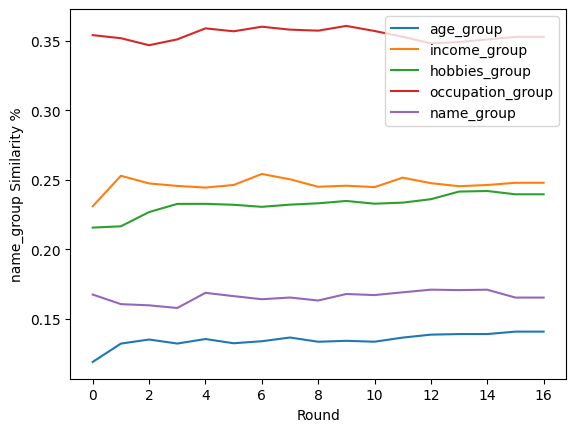

In [94]:
grid = LLMGrid(mode="india", setting="50per-favourable")
grid.simulate(max_rounds=100)
grid.plot()

Score already computed for 229 and 1816
Score already computed for 229 and 2007
Score already computed for 229 and 1789
Score already computed for 851 and 2960
Score already computed for 851 and 2276
Score already computed for 851 and 2494
Score already computed for 360 and 1292
Score already computed for 360 and 1543
Score already computed for 360 and 2978
Score already computed for 2141 and 569
Score already computed for 2141 and 24
Score already computed for 2141 and 99
Score already computed for 2141 and 2111
Score already computed for 2141 and 1760
Score already computed for 2141 and 2799
Score already computed for 1789 and 2824
Score already computed for 1789 and 1816
Score already computed for 1789 and 1671
Score already computed for 1789 and 229
Score already computed for 2707 and 1755
Score already computed for 2707 and 1119
Score already computed for 2707 and 1157
Score already computed for 2707 and 2558
Score already computed for 2514 and 1009
Score already computed for 2514

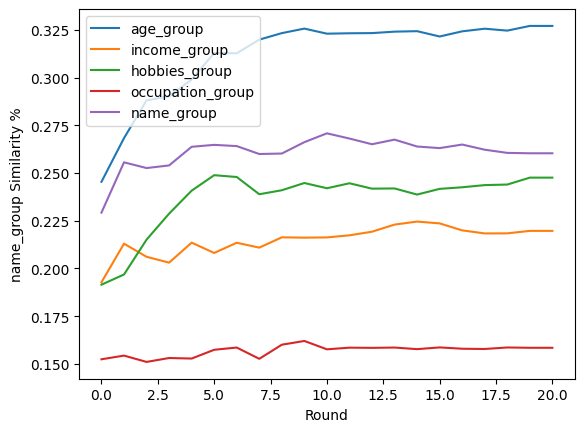

In [99]:
grid = LLMGrid(mode="us", setting="50per-favourable")
grid.simulate(max_rounds=100)
grid.plot()

Score already computed for 229 and 2405
Score already computed for 229 and 2618
Score already computed for 229 and 289
Score already computed for 229 and 245
Score already computed for 851 and 2188
Score already computed for 851 and 395
Score already computed for 851 and 856
Score already computed for 851 and 360
Score already computed for 851 and 2243
Score already computed for 360 and 2499
Score already computed for 360 and 856
Score already computed for 360 and 2188
Score already computed for 360 and 31
Score already computed for 360 and 851
Score already computed for 2141 and 1212
Score already computed for 2141 and 624
Score already computed for 2141 and 1323
Score already computed for 1789 and 2522
Score already computed for 1789 and 2509
Score already computed for 1789 and 1584
Score already computed for 1789 and 2457
Score already computed for 1789 and 2380
Score already computed for 2707 and 923
Score already computed for 2707 and 2933
Score already computed for 2707 and 319
S

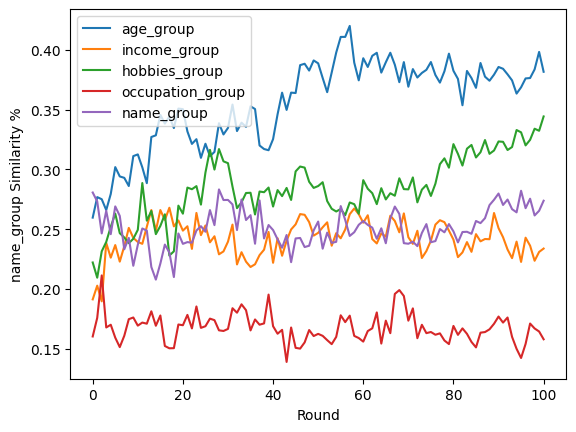

In [96]:
grid = LLMGrid(mode="us", setting="75per-favourable")
grid.simulate(max_rounds=100)
grid.plot()

Score already computed for 262 and 1163
Score already computed for 262 and 1921
Score already computed for 928 and 372
Score already computed for 928 and 775
Score already computed for 928 and 1082
Score already computed for 928 and 1933
Score already computed for 928 and 1487
Score already computed for 928 and 2534
Score already computed for 2323 and 2493
Score already computed for 2323 and 345
Score already computed for 2323 and 980
Score already computed for 1653 and 1738
Score already computed for 1653 and 2262
Score already computed for 1653 and 1556
Score already computed for 33 and 2130
Score already computed for 33 and 2971
Score already computed for 33 and 1525
Score already computed for 33 and 567
Score already computed for 935 and 107
Score already computed for 935 and 2857
Score already computed for 935 and 679
Score already computed for 935 and 2764
Score already computed for 935 and 2970
Score already computed for 935 and 1525
Score already computed for 935 and 1101
Score

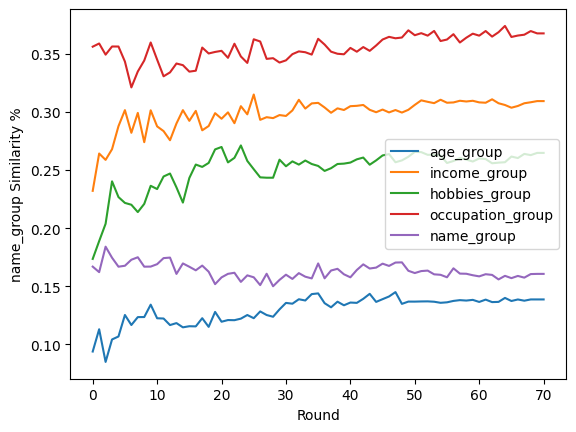

In [97]:
grid = LLMGrid(mode="india", setting="75per-favourable")
grid.simulate(max_rounds=100)
grid.plot()